In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('../data/UnknownKinaseMotif.txt', sep='\t')
df

,KIN_ACC_ID,SUB_ACC_ID,score,Family,GENE,UP_POS,+/-7AA
0,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,365,NSQPEKMSQEPEINK
1,Q5S007,A0A0A6YYL3,307,LRRK,LRRK2,490,EDLLRENSMLREEIA
2,O43318,A0AUZ9,540,MLK,MAP3K7,756,LSRIQNSSRNTARRR
3,O14578,A0AV96,270,DMPK,CIT,453,IPAIGAQYSMFPAAP
4,O14578,A0AV96,270,DMPK,CIT,519,PFQGRPITPVYTVAP
...,...,...,...,...,...,...,...
66377,P49841,Q9Y6Y0,270,GSK,GSK3B,330,PQSSPTSTPKLSKSL
66378,P49841,Q9Y6Y0,270,GSK,GSK3B,336,STPKLSKSLSFEMQQ
66379,P49841,Q9Y6Y0,270,GSK,GSK3B,338,PKLSKSLSFEMQQDE
66380,P49841,Q9Y6Y0,270,GSK,GSK3B,352,ELIEKPMSPMQYARS


In [3]:
df[['Family', '+/-7AA']].head()

,Family,+/-7AA
0,LRRK,NSQPEKMSQEPEINK
1,LRRK,EDLLRENSMLREEIA
2,MLK,LSRIQNSSRNTARRR
3,DMPK,IPAIGAQYSMFPAAP
4,DMPK,PFQGRPITPVYTVAP


In [18]:
df['Family'].value_counts()

LRRK    6284
CDK     4342
DMPK    4177
EGFR    2887
PIKK    2582
        ... 
MOS       16
ABC1      15
Lmr       10
TSSK       6
KIS        4
Name: Family, Length: 97, dtype: int64

In [10]:
df['+/-7AA'].value_counts()

MPKFKMPSFGVSAPG    16
ELAKHAVSEGTKAVT    14
KAMGIMNSFVNDIFE    14
VHPDTGISSKAMGIM    14
ITSREIQTAVRLLLP    13
                   ..
EREQNGFSVKSSPNP     1
QNGFSVKSSPNPFVG     1
NGFSVKSSPNPFVGS     1
SPNPFVGSPPKGLSI     1
IVGGSDPYGQKGLKN     1
Name: +/-7AA, Length: 64022, dtype: int64

In [4]:
df['Family'].nunique()

97

In [5]:
# !pip install logomaker 

In [6]:
df.groupby('Family')['+/-7AA'].apply(list)

Family
ABC1     [GIQDRVLYVLKLYDK, KIDPEKLSVNSHFMK, ATFTRGRSINL...
ALK      [nan, DSMDMDMSPLRPQNY, SPLRPQNYLFGCELK, QLSLRT...
Abl      [RGRSKRSSDPSPAGD, APAKGNKSPSPPDGS, AKGNKSPSPPD...
Akt      [nan, ESDARSESPQPAPDW, REDNDLDSQVSQEGL, NDLDSQ...
Alpha    [nan, QKCRTSGSVYITLKK, CRTSGSVYITLKKYD, LKKYDG...
                               ...                        
ULK      [EPIGARLSLEAPGPA, RRRCRARSFSLPADP, RCRARSFSLPA...
VEGFR    [GMSERNLSALENYNF, NLSALENYNFELVDG, KLNTQSTYSEA...
VRK      [LGFLCDCTVLVGDAR, SDQALDLSLKSGPRQ, ALDLSLKSGPR...
WEE      [EPSSRSGSPDREGRA, LQKILENTVPDASAY, PVLQRAVSALQ...
WNK      [EASRCRLSPSGDSVF, LSRWQNRTMENLVEL, TRNKVRKTFVG...
Name: +/-7AA, Length: 97, dtype: object

In [11]:
aligned_sequences

['GKAPDFKPGKRILPS',
 'IITYKPPKEEGEPLR',
 'QDFGFANGDAFPGGM',
 'DPTTSKFTSKVNWRA',
 'RERKNAIRGLVARLP',
 'VKGSDVIDLDQAGGP',
 'LLRQLDKLMRGVRAA',
 'YSSYSSTSYSSTSSS',
 'VVIILLPPDDNRFVR',
 'LNNLCEKQLVGRAIA',
 'KSLSLQGHKTEFLGP',
 'LHAVPITMDEFGAIQ',
 'YFLSVSRVQRPIRDM',
 'DMSRFNDVGEFPAPR',
 'KKHESLLRGGLGAVA']

In [15]:
kinase_sequences

Family
ABC1     [GIQDRVLYVLKLYDK, KIDPEKLSVNSHFMK, ATFTRGRSINL...
ALK      [nan, DSMDMDMSPLRPQNY, SPLRPQNYLFGCELK, QLSLRT...
Abl      [RGRSKRSSDPSPAGD, APAKGNKSPSPPDGS, AKGNKSPSPPD...
Akt      [nan, ESDARSESPQPAPDW, REDNDLDSQVSQEGL, NDLDSQ...
Alpha    [nan, QKCRTSGSVYITLKK, CRTSGSVYITLKKYD, LKKYDG...
                               ...                        
ULK      [EPIGARLSLEAPGPA, RRRCRARSFSLPADP, RCRARSFSLPA...
VEGFR    [GMSERNLSALENYNF, NLSALENYNFELVDG, KLNTQSTYSEA...
VRK      [LGFLCDCTVLVGDAR, SDQALDLSLKSGPRQ, ALDLSLKSGPR...
WEE      [EPSSRSGSPDREGRA, LQKILENTVPDASAY, PVLQRAVSALQ...
WNK      [EASRCRLSPSGDSVF, LSRWQNRTMENLVEL, TRNKVRKTFVG...
Name: +/-7AA, Length: 97, dtype: object

c:\Users\sadia\anaconda3\lib\site-packages\logomaker\src\Logo.py:194: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=self.figsize)


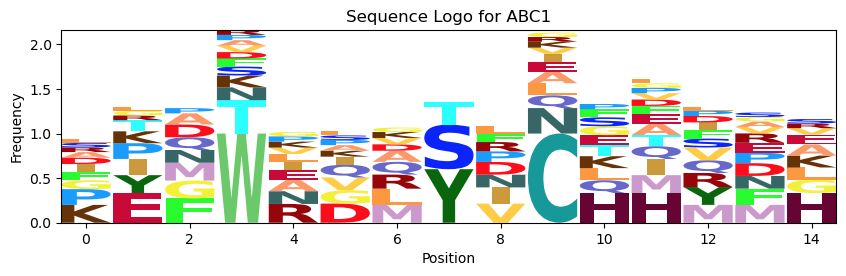

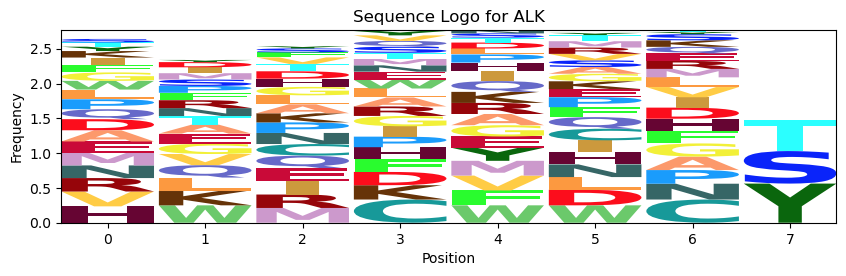

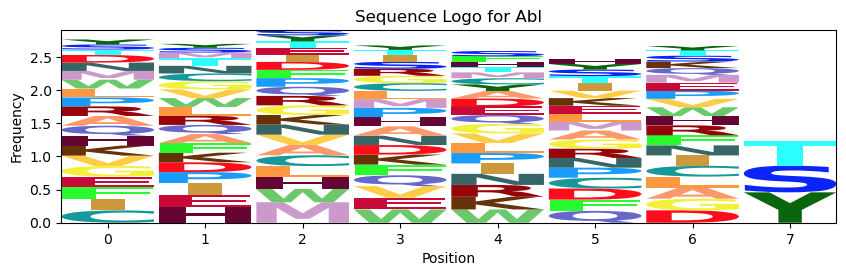

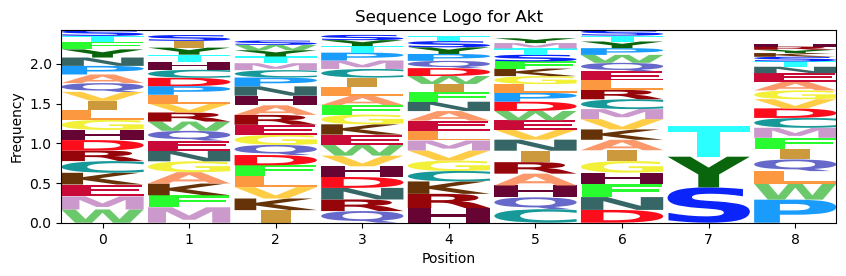

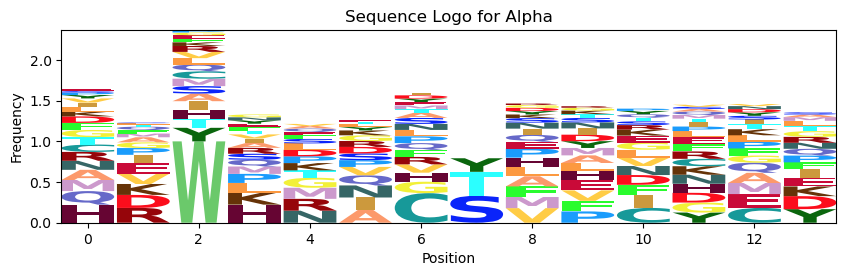

...

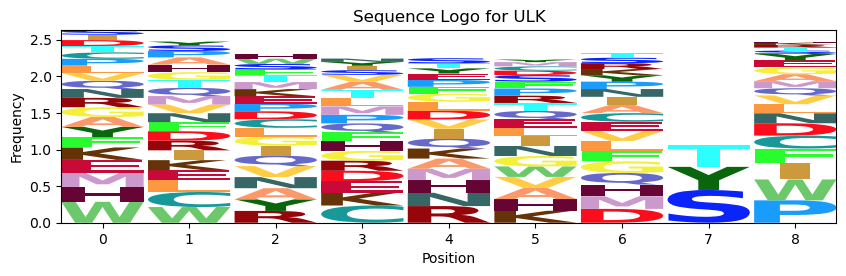

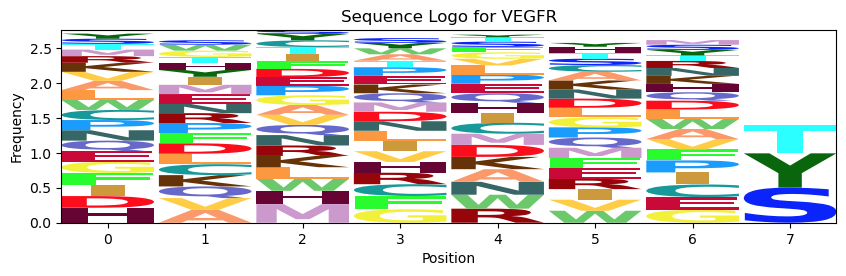

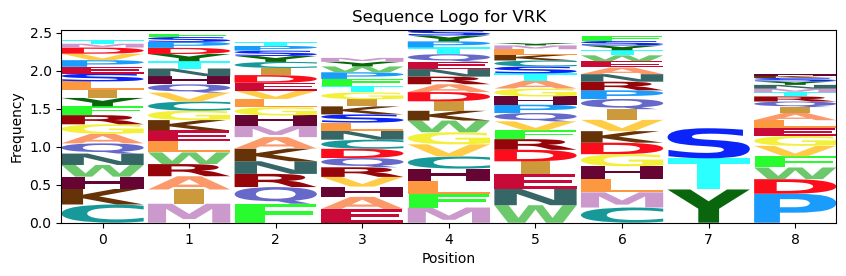

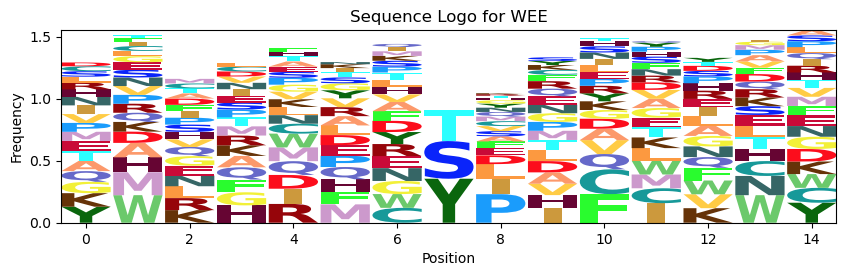

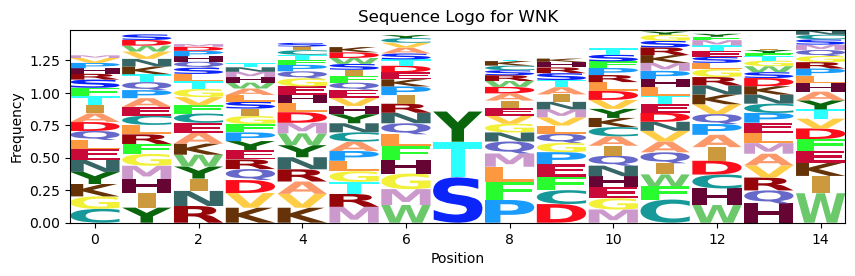

In [17]:
import logomaker
from collections import Counter

# Group by 'KINASE_psp' and combine all sequences into a list
kinase_sequences = df.groupby('Family')['+/-7AA'].apply(list)

# Initialize an empty dictionary to store the Logos for each kinase
kinase_logos = {}

# For each kinase, create a position frequency matrix and then a sequence logo
for kinase, sequences in kinase_sequences.items():
    # Combine sequences into a single string for each position
    try: 
        # remove nan from the sequence list 
        sequences = [seq for seq in sequences if isinstance(seq, str)]
        aligned_sequences = [''.join(seq) for seq in zip(*sequences)]
    except:
        print(f"Error with {kinase} the sequence is {sequences}")
        continue
    
    # Create a DataFrame where each row corresponds to one position
    position_df = pd.DataFrame([Counter(pos) for pos in aligned_sequences]).fillna(0)
    
    # Normalize the counts to get frequencies
    position_freq_matrix = position_df.div(position_df.sum(axis=0), axis=1)
    
    # Create the sequence logo
    logo = logomaker.Logo(position_freq_matrix, color_scheme='skylign_protein', stack_order='small_on_top')
    
    # Set title and axis labels
    logo.ax.set_title(f'Sequence Logo for {kinase}')
    logo.ax.set_xlabel('Position')
    logo.ax.set_ylabel('Frequency')
    
    # Store the logo in the dictionary
    kinase_logos[kinase] = logo

